# Working with Medical Image

## Biomedical Imaging Coordinate System

Coordinate system is used for identifying the location of a point. Three types coordinate systems commonly used in imaging applications: 
- **World Coordinate**,
- **Anatomical Coordinate** (also called the Patient Coordinate System) and 
- **Medical Image Coordinate** systems.


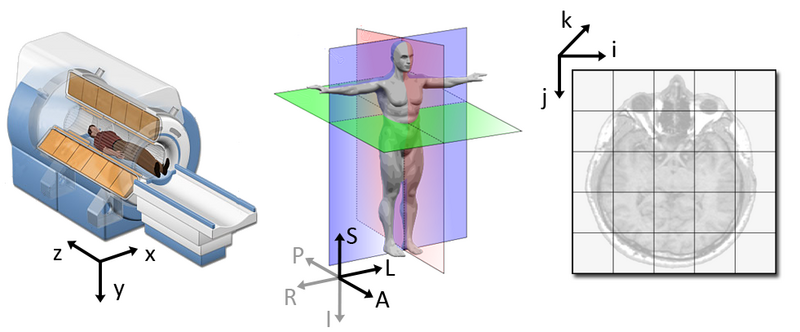

### World Coordinate System

*The world coordinate system is typically a Cartesian coordinate system in which a model (e.g. a MRI scanner or a patient) is positioned. Every model has its own coordinate system but there is only one world coordinate system to define the position and orientation of each model.*


### Anatomical Coordinate System

*The most important model coordinate system for medical imaging techniques is the anatomical space. This space consists of **three planes** to describe the standard anatomical position of a human:*

The anatomical coordinate system is a continuous three-dimensional space in which an image has been sampled. In neuroimaging, it is common to define this space with respect to the human whose brain is being scanned. Hence the 3D basis is defined along the anatomical axes of anterior-posterior, inferior-superior, and left-right.


#### Axial Plane:

*The axial plane is parallel to the ground and a slice near the head is referred to as **superior** while a slice closer to the feet, is known as the **inferior**. The axial plane is actually when you place point of view above the patient and look down. Depending on the region of the 3D medical image you will observe different anatomical structures.* The image below shows the Axial View of a CT scan of the chest - 

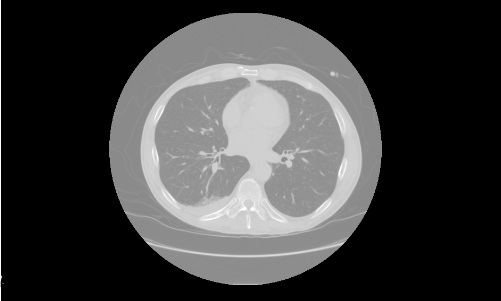

#### Coronal Plane:

 *The coronal plane is perpendicular to the ground and separates the front from the back. In this, the point of view is either in front of eyes(**anterior plane**) or back of the patient(**posterior plane**).* The image below shows the Coronal View of a CT scan of the chest - 

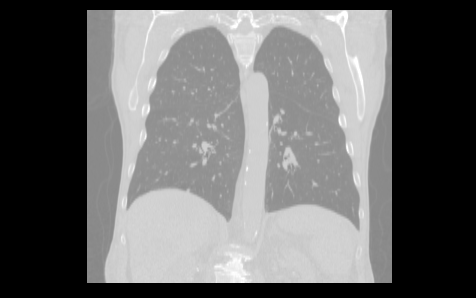

#### Sagittal Plane:
*The sagittal plane separates the Left from the Right. Basically, this is a side view. Instead of looking from above the patient, now we look from the side. The side can be either right or left. Which side and direction is the positive one, depends on the coordinate system.* The image below shows the Sagittal View of a CT scan of the chest -


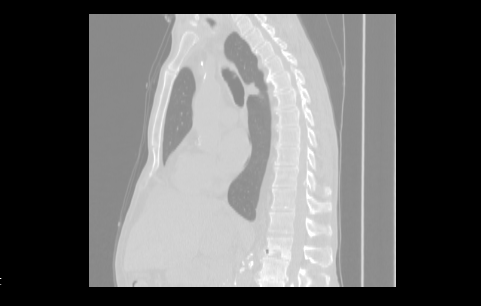

### Medical Image Coordinate System (Voxel Space)

*The image coordinate system describes **how an image was acquired with respect to the anatomy**. Medical scanners create 3D arrays/tensors of points and cells which start at the upper left corner. `The i axis increases to the right, the j axis to the bottom and the k axis backwards.`*

*In addition to the intensity value of each voxel (i, j, k), the origin and spacing of the anatomical coordinates are stored in the form of metadata. `The origin represents the position of the first voxel (0,0,0) in the anatomical coordinate system and the spacing specifies the distance between voxels along each axis`. Using the origin and spacing, the corresponding position of each (image coordinate) voxel in anatomical coordinates can be calculated.*

*`Voxel spacing is basically the real size of the voxel that corresponds to a 3D region and the distance between two voxels.`*

## DICOM

**DICOM** defines standards for storing data in memory and on disk, and for communicating this data between machines over a network. DICOM files are binary dumps of the objects in memory that DICOM sends across the network.

A DICOM image file is an outcome of the **Digital Imaging and COmmunications in Medicine** standard and represented as **`.dcm`**. It is a standard, internationally accepted format to view, store, retrieve and share medical images. DICOM differs from other image formats because it groups information into datasets. DICOM file consist of **header** and **image data** collectively in one file. 

The header metadata consists of data that describes the image, and the patient data. Patient data could include information about the patient’s demographic information like name, age, gender, and date of birth. The metadata may also contain information about image characteristics such as acquisition parameters, pixel intensity, matrix size, and dimensions of the image, type of the image (CT, MRI, etc..), the context of the imaging study, etc... These metadata information are coded onto the image so that the patient to whom the image belongs can be easily identified.

**DICOM Communications Protocol -**
DICOM not only defines the image and metadata but also the transport layer protocol that enables easy communication and passage of information through the network. The entire standard is made up of multiple related but independent sections. Nevertheless, all medical imaging applications that are connected to the hospital network use the DICOM protocol to exchange information, which is mainly DICOM images.


## Pydicom and NiBabel

Medical image data are coded in 2 formats, **DICOM** and **NIfTI** formats are used. 
- **DICOM** format has multiple 2d image slices which together form a 3d image.
- **NIfTI** format has only one file that contains the 3d image. 

**Pydicom** and **NiBabel** are libraries to dela with the DICOM and NIfTI images respectively. Both libraries load the images in a numpy array format, which makes it easy to extract and save 2d images in the jpg format.


## Analyze DICOM Images

**pydicom** a Python package developed for working with DICOM files and images contains APIs for reading, viewing, modifying the dcm files and objects. Pydicom provides an interface to read the complex DICOM files for easy interpretation.
It contains APIs to manipulate image and metadata contained in the DICOM files.

### use pydicom package

In [ ]:
! pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 21.4 MB/s 


In [ ]:
from pydicom.data import get_testdata_file
import pydicom

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Reading .dcm Files

In [ ]:
path = get_testdata_file("CT_small.dcm")
path

'/usr/local/lib/python3.7/dist-packages/pydicom/data/test_files/CT_small.dcm'

In [ ]:
dicom = pydicom.read_file(path)

In [ ]:
type(dicom)

pydicom.dataset.FileDataset

In [ ]:
dir(dicom)

['AccessionNumber',
 'AcquisitionDate',
 'AcquisitionNumber',
 'AcquisitionTime',
 'AdditionalPatientHistory',
 'BitsAllocated',
 'BitsStored',
 'Columns',
 'ContentDate',
 'ContentTime',
 'ContrastBolusAgent',
 'ContrastBolusRoute',
 'ConvolutionKernel',
 'DataCollectionDiameter',
 'DataSetTrailingPadding',
 'DistanceSourceToDetector',
 'DistanceSourceToPatient',
 'Exposure',
 'ExposureTime',
 'FilterType',
 'FocalSpots',
 'FrameOfReferenceUID',
 'GantryDetectorTilt',
 'HighBit',
 'ImageComments',
 'ImageOrientationPatient',
 'ImagePositionPatient',
 'ImageType',
 'InstanceCreationDate',
 'InstanceCreationTime',
 'InstanceCreatorUID',
 'InstanceNumber',
 'InstitutionName',
 'KVP',
 'Laterality',
 'Manufacturer',
 'ManufacturerModelName',
 'Modality',
 'OtherPatientIDsSequence',
 'PatientAge',
 'PatientBirthDate',
 'PatientID',
 'PatientName',
 'PatientPosition',
 'PatientSex',
 'PatientWeight',
 'PhotometricInterpretation',
 'PixelData',
 'PixelPaddingValue',
 'PixelRepresentation',
 

## DICOM Structure

- **Header:** Meta Data such as:
1. Device Information (Modality, ...)
2. Patient Information
3. Image Information

- **Body:** Actual image pixcel data (2D, 3D, 4D, ...)

### DICOM Header

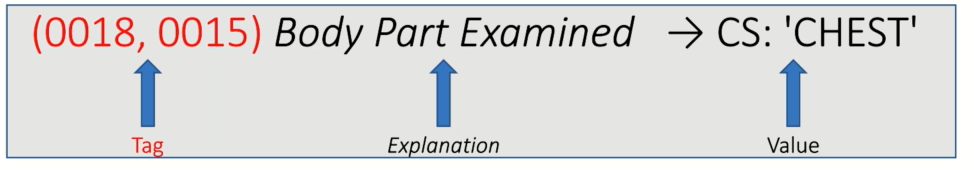

In [ ]:
dicom

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 192
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.5962.1.1.1.1.1.20040119072730.12322
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.5962.2
(0002, 0013) Implementation Version Name         SH: 'DCTOOL100'
(0002, 0016) Source Application Entity Title     AE: 'CLUNIE1'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0012) Instance Creation Date              DA: '20040119'
(0008, 0013) Instance Creation Time              TM: '072731'
(0008, 0014) Instance Creator UID                U

### Read Metadata

As discussed in the sections above, the metadata includes the **patient's demographic information** and the details about the CT modality and other details which can be seen in the result above.  All the metadata details can be accessed using Pydicom which creates attributes with the same names and assigns appropriate values.

Some of the metadata can be seen below -

**DICOM MetaData Tree**

https://dicom.innolitics.com/ciods

In [ ]:
dir(dicom)

['AccessionNumber',
 'AcquisitionDate',
 'AcquisitionNumber',
 'AcquisitionTime',
 'AdditionalPatientHistory',
 'BitsAllocated',
 'BitsStored',
 'Columns',
 'ContentDate',
 'ContentTime',
 'ContrastBolusAgent',
 'ContrastBolusRoute',
 'ConvolutionKernel',
 'DataCollectionDiameter',
 'DataSetTrailingPadding',
 'DistanceSourceToDetector',
 'DistanceSourceToPatient',
 'Exposure',
 'ExposureTime',
 'FilterType',
 'FocalSpots',
 'FrameOfReferenceUID',
 'GantryDetectorTilt',
 'HighBit',
 'ImageComments',
 'ImageOrientationPatient',
 'ImagePositionPatient',
 'ImageType',
 'InstanceCreationDate',
 'InstanceCreationTime',
 'InstanceCreatorUID',
 'InstanceNumber',
 'InstitutionName',
 'KVP',
 'Laterality',
 'Manufacturer',
 'ManufacturerModelName',
 'Modality',
 'OtherPatientIDsSequence',
 'PatientAge',
 'PatientBirthDate',
 'PatientID',
 'PatientName',
 'PatientPosition',
 'PatientSex',
 'PatientWeight',
 'PhotometricInterpretation',
 'PixelData',
 'PixelPaddingValue',
 'PixelRepresentation',
 

In [ ]:
print()
print(f"File path........: {path}")
print()

pat_name = dicom.PatientName
display_name = pat_name.family_name + ", " + pat_name.given_name
print(f"Patient's Name...: {display_name}")
print(f"Patient's Sex...: {dicom.PatientSex}")
print(f"Patient's Age...: {dicom.PatientAge}")
print(f"Patient's Weight...: {dicom.PatientWeight}")
print(f"Patient ID.......: {dicom.PatientID}")
print(f"Modality.........: {dicom.Modality}")
print(f"Study Date.......: {dicom.StudyDate}")
print(f"Image type.......: {dicom.ImageType}")
print(f"Image size.......: {dicom.Rows} x {dicom.Columns}")


File path........: /usr/local/lib/python3.7/dist-packages/pydicom/data/test_files/CT_small.dcm

Patient's Name...: CompressedSamples, CT1
Patient's Sex...: O
Patient's Age...: 000Y
Patient's Weight...: 0.000000
Patient ID.......: 1CT1
Modality.........: CT
Study Date.......: 20040119
Image type.......: ['ORIGINAL', 'PRIMARY', 'AXIAL']
Image size.......: 128 x 128


In [ ]:
type(dicom.PixelData)

bytes

In [ ]:
dicom.PixelData

b'\xaf\x00\xb4\x00\xa6\x00\x8f\x00\x8b\x00\x98\x00\xa7\x00\xbb\x00\xd4\x00\xec\x00\xe5\x00\xd5\x00\xcb\x00\xcd\x00\xbf\x00\xcc\x00\xcf\x00\xc5\x00\xc0\x00\xba\x00\xbf\x00\xce\x00\xfc\x00F\x01j\x01R\x019\x01\x05\x01\xe1\x00\xd5\x00\xd0\x00\xbc\x00\xb3\x00\xce\x00\xd2\x00\xc7\x00\xc0\x00\xd8\x00\xfb\x00\xe3\x00\xcf\x00\xcb\x00\xce\x00\xd3\x00\xed\x00]\x01[\x029\x03\xbe\x03\x1d\x04\x04\x04\n\x04\x1c\x04\x0b\x04\x14\x04\x13\x04\xec\x03\xe3\x03\xd2\x03\xb3\x03\xa8\x03\x9f\x03\xa8\x03\xca\x03\xea\x03\xdf\x03\xdb\x03\xe2\x03\xef\x03\x11\x048\x04T\x04i\x04\x97\x04\xa7\x04\xa0\x04\x98\x04\xae\x04\xb5\x04\xa8\x04\x9a\x04\x96\x04\xa5\x04\x8d\x04\x9f\x04\xa6\x04\x9e\x04\x9c\x04\x96\x04\xb3\x04\xb0\x04\x9f\x04\xa1\x04\x9f\x04\x9f\x04\x88\x04y\x04\x88\x04\x88\x04~\x04\x8a\x04\x90\x04\x95\x04\x98\x04\x8c\x04\x95\x04\x7f\x04K\x04\xd9\x03\xfa\x02z\x02\xe0\x017\x01\xdc\x00\x9d\x00\x94\x00\x9c\x00\xbb\x00\xcd\x00\xbd\x00\x91\x00\x86\x00\x94\x00\xbb\x00\xdd\x00\xcb\x00\xcf\x00\xd8\x00\xba\x00\xb7\x00\x9d\

### Viewing Image Files

The image pixel data information is stored as part of the **pixel_array** metadata and can be extracted by reading the metadata. 

In [ ]:
image = dicom.pixel_array
image

array([[175, 180, 166, ..., 203, 207, 216],
       [186, 183, 157, ..., 181, 190, 239],
       [184, 180, 171, ..., 152, 164, 235],
       ...,
       [906, 910, 923, ..., 922, 929, 927],
       [914, 954, 938, ..., 942, 925, 905],
       [959, 955, 916, ..., 911, 904, 909]], dtype=int16)

In [ ]:
print("Shape of the extracted DICOM image:", image.shape)
print("Minimum pixel value:", image.min())
print("Maximum pixel value:", image.max())

Shape of the extracted DICOM image: (128, 128)
Minimum pixel value: 128
Maximum pixel value: 2191


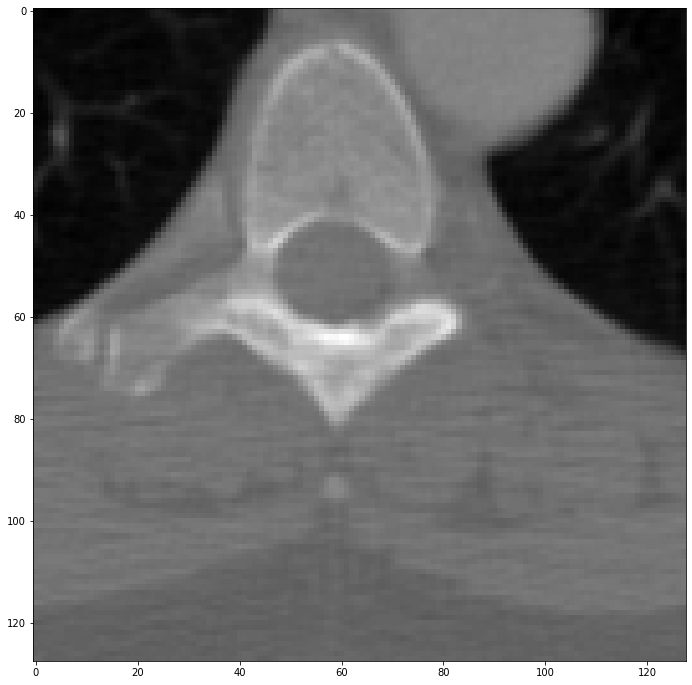

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(image, 'gray');

### Modifying Metadata

A metadata value of any element can be modified by retrieving it and setting the value.

In [ ]:
print('Original Metadata')
print(f"File path........: {path}")
print()

pat_name = dicom.PatientName
display_name = pat_name.family_name + ", " + pat_name.given_name
print(f"Patient's Name...: {display_name}")
print(f"Patient's Sex...: {dicom.PatientSex}")
print(f"Patient's Age...: {dicom.PatientAge}")
print(f"Patient's Weight...: {dicom.PatientWeight}")
print(f"Patient ID.......: {dicom.PatientID}")
print(f"Modality.........: {dicom.Modality}")
print(f"Study Date.......: {dicom.StudyDate}")
print(f"Image type.......: {dicom.ImageType}")
print(f"Image size.......: {dicom.Rows} x {dicom.Columns}")

Original Metadata
File path........: /usr/local/lib/python3.7/dist-packages/pydicom/data/test_files/CT_small.dcm

Patient's Name...: CompressedSamples, CT1
Patient's Sex...: O
Patient's Age...: 000Y
Patient's Weight...: 0.000000
Patient ID.......: 1CT1
Modality.........: CT
Study Date.......: 20040119
Image type.......: ['ORIGINAL', 'PRIMARY', 'AXIAL']
Image size.......: 128 x 128


In [ ]:
dicom.PatientName = "Test, Patient"
dicom.PatientID = "956789320"
dicom.PatientAge = 34

In [ ]:
print('Modified Metadata')
print(f"File path........: {path}")
print()

pat_name = dicom.PatientName
display_name = pat_name.family_name + ", " + pat_name.given_name
print(f"Patient's Name...: {display_name}")
print(f"Patient's Sex...: {dicom.PatientSex}")
print(f"Patient's Age...: {dicom.PatientAge}")
print(f"Patient's Weight...: {dicom.PatientWeight}")
print(f"Patient ID.......: {dicom.PatientID}")
print(f"Modality.........: {dicom.Modality}")
print(f"Study Date.......: {dicom.StudyDate}")
print(f"Image type.......: {dicom.ImageType}")
print(f"Image size.......: {dicom.Rows} x {dicom.Columns}")

Modified Metadata
File path........: /usr/local/lib/python3.7/dist-packages/pydicom/data/test_files/CT_small.dcm

Patient's Name...: Test, Patient, 
Patient's Sex...: O
Patient's Age...: 34
Patient's Weight...: 0.000000
Patient ID.......: 956789320
Modality.........: CT
Study Date.......: 20040119
Image type.......: ['ORIGINAL', 'PRIMARY', 'AXIAL']
Image size.......: 128 x 128


## CT Scan

In [ ]:
!wget 'https://raw.githubusercontent.com/sauravmishra1710/Bio-Medical-Image-Analysis-with-DICOMs/main/data/CT%20Medical%20Images/ID_0000_AGE_0060_CONTRAST_1_CT.dcm'

--2022-08-10 09:44:49--  https://raw.githubusercontent.com/sauravmishra1710/Bio-Medical-Image-Analysis-with-DICOMs/main/data/CT%20Medical%20Images/ID_0000_AGE_0060_CONTRAST_1_CT.dcm
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 528130 (516K) [application/octet-stream]
Saving to: ‘ID_0000_AGE_0060_CONTRAST_1_CT.dcm’

ID_0000_AGE_0060_CO 100%[===================>] 515.75K  --.-KB/s    in 0.03s   

2022-08-10 09:44:49 (17.7 MB/s) - ‘ID_0000_AGE_0060_CONTRAST_1_CT.dcm’ saved [528130/528130]



In [ ]:
path = '/content/ID_0000_AGE_0060_CONTRAST_1_CT.dcm'

In [ ]:
dicom = pydicom.read_file(path)
dicom

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 194
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.14519.5.2.1.7777.9002.108821836759549281694712274169
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'dcm4che-1.4.31'
-------------------------------------------------
(0008, 0000) Group Length                        UL: 430
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.3.6.1.4.1.14519.5.2.1.7777.9002.1088

In [ ]:
image = dicom.pixel_array
image

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [ ]:
print("Shape of the extracted DICOM image:", image.shape)
print("Minimum pixel value:", image.min())
print("Maximum pixel value:", image.max())

Shape of the extracted DICOM image: (512, 512)
Minimum pixel value: 0
Maximum pixel value: 1918


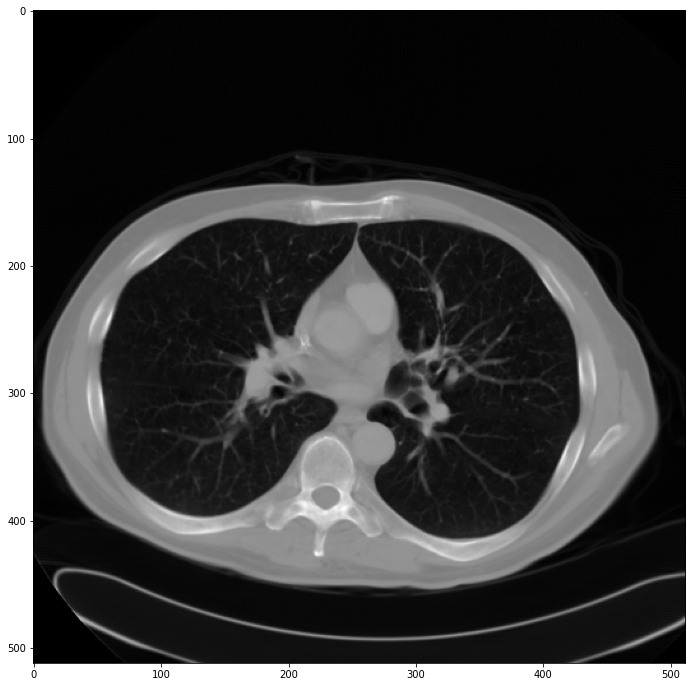

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(image, 'gray');

### DICOM Measurement Unit (CT Scans)

The unit of measurement in CT scans is the **Hounsfield Unit (HU)**, which is a measure of **radio density**.
Each pixel is assigned a numerical value (CT number), which is the **average of all the attenuation values contained within the corresponding voxel**. This number is compared to the attenuation value of water and displayed on a scale of arbitrary units named Hounsfield units (HU) after Sir Godfrey Hounsfield.

This scale assigns water as an attenuation value (HU) of zero. The range of CT numbers is 2000 HU wide although some modern scanners have a greater range of HU up to 4000. Each number represents a shade of grey with +1000 (white) and –1000 (black) at either end of the spectrum.

CT displays a huge range of densities ranging from air (black) to bone (white). On the Hounsfield scale, water represented by 0 value, **air is represented by a value of −1000 (black on the grey scale)** and bone between +700 (cancellous bone) to +3000 (dense bone) (**white on the grey scale**). As bones are much denser than surrounding soft tissues, they show up very clearly in CT images. By normalizing to values of water and air (water has HU 0 and air -1000) the images of different measurements become distinct and comparable.

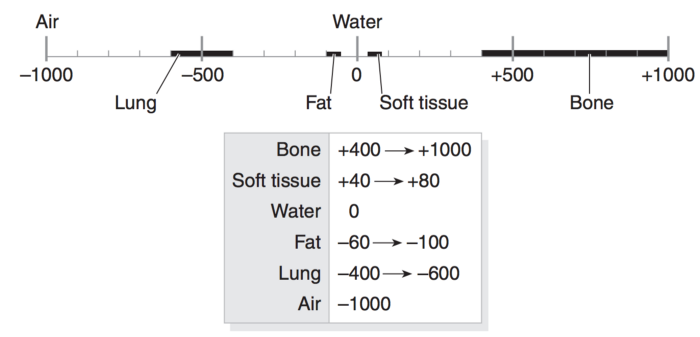

### Converting a CT DICOM to HU Scale

### Image Windowing

DICOM images may have a wide range from -1000 to +1000 (on the HU scale) and for humans to be able to see relevant structures within the image a process known as **image windowing** is utilized. Windowing can be thought of as a means of manipulating the HU scale values to change the apperance of the image and highlight structures that are important for the particular study. 

*Window Center and Window Width specify a linear conversion from stored pixel values to values to be displayed.  These values are particularly important for X-ray/CT scanners as they tend to generate consistently calibrated intensities so we can use a specific Center: Width pair for every image. Finding out the window width and window center is called windowing technique.

Windowing, also known as **grey-level mapping**, **contrast stretching**, **histogram modification** or **contrast enhancement** is the process in which the CT image greyscale component of an image is manipulated via the CT numbers; doing this will change the appearance of the picture to highlight particular structures. The brightness of the image is adjusted via the window level. The contrast is adjusted via the window width.

**Window width:** The window width (WW) as the name suggests is the measure of the range of CT numbers that an image contains. A wider window width (2000 HU), therefore, will display a wider range of CT numbers. Consequently, the transition of dark to light structures will occur over a larger transition area to that of a narrow window width (<1000 HU).

- **Wide window:** Defined as 400-2000 HU best used in areas of acute differing attenuation values, a good example is lungs or cortical tissue, where air and vessels will sit side by side. 

- **Narrow window:** Defined as 50-350 HU are excellent when examining areas of similar attenuation, for example, soft tissue.

**Window level/center:**
The window level (WL), often also referred to as window center, is the midpoint of the range of the CT numbers displayed.
When the window level is decreased the CT image will be brighter and vice versa.

In [ ]:
from pydicom.pixel_data_handlers.util import apply_modality_lut

In [ ]:
hu_image = apply_modality_lut(image, dicom)
hu_image

array([[-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       ...,
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.]])

In [ ]:
def filter_hu_image(hu_image, min_val, max_val):
    result = np.where(((hu_image>=min_val) & (hu_image<=max_val)), hu_image.max(), hu_image.min())
    return result

In [ ]:
soft_tissue = filter_hu_image(hu_image, 40, 80)
soft_tissue

array([[-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       ...,
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.]])

In [ ]:
bone = filter_hu_image(hu_image, 400, 1000)
bone

array([[-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       ...,
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.]])

In [ ]:
lung = filter_hu_image(hu_image, -600, -400)
lung

array([[-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       ...,
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.],
       [-1024., -1024., -1024., ..., -1024., -1024., -1024.]])

(-0.5, 511.5, 511.5, -0.5)

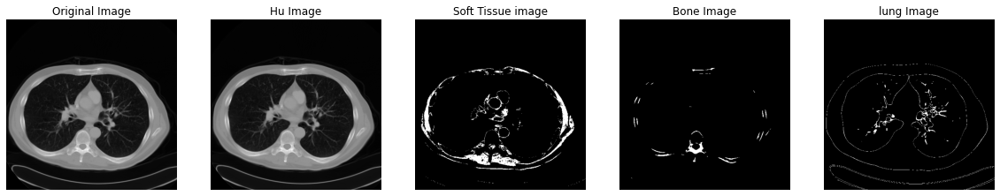

In [ ]:
# plot_image(bone_image)
plt.figure(figsize=(20, 10));
plt.style.use('grayscale');

plt.subplot(151)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(152)
plt.imshow(hu_image)
plt.title('Hu Image')
plt.axis('off')

plt.subplot(153)
plt.imshow(soft_tissue)
plt.title('Soft Tissue image')
plt.axis('off')

plt.subplot(154)
plt.imshow(bone)
plt.title('Bone Image')
plt.axis('off')

plt.subplot(155)
plt.imshow(lung)
plt.title('lung Image')
plt.axis('off')

## CT Slices

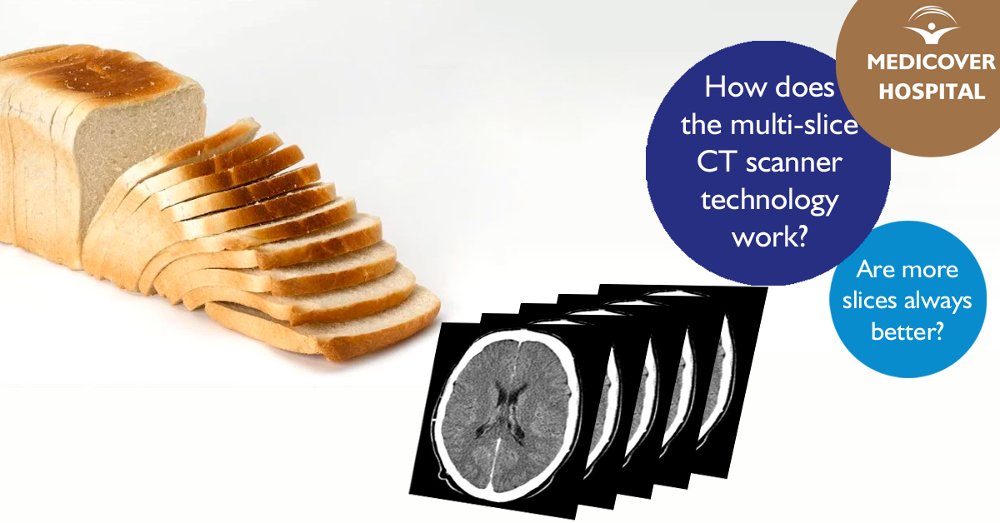

In [ ]:
import subprocess
from tqdm.notebook import trange

In [ ]:
! mkdir 'CT-slices'

In [ ]:
for i in trange(30):
    commend = f'https://github.com/sauravmishra1710/Bio-Medical-Image-Analysis-with-DICOMs/raw/main/data/OSIC_Pulmonary/train/ID00007637202177411956430/{i+1}.dcm'
    path = 'CT-slices'

    subprocess.call(['wget', '-P', path, commend])

  0%|          | 0/30 [00:00<?, ?it/s]

In [ ]:
import glob

paths = sorted(glob.glob('CT-slices/*.dcm'))
paths

['CT-slices/1.dcm',
 'CT-slices/10.dcm',
 'CT-slices/11.dcm',
 'CT-slices/12.dcm',
 'CT-slices/13.dcm',
 'CT-slices/14.dcm',
 'CT-slices/15.dcm',
 'CT-slices/16.dcm',
 'CT-slices/17.dcm',
 'CT-slices/18.dcm',
 'CT-slices/19.dcm',
 'CT-slices/2.dcm',
 'CT-slices/20.dcm',
 'CT-slices/21.dcm',
 'CT-slices/22.dcm',
 'CT-slices/23.dcm',
 'CT-slices/24.dcm',
 'CT-slices/25.dcm',
 'CT-slices/26.dcm',
 'CT-slices/27.dcm',
 'CT-slices/28.dcm',
 'CT-slices/29.dcm',
 'CT-slices/3.dcm',
 'CT-slices/30.dcm',
 'CT-slices/4.dcm',
 'CT-slices/5.dcm',
 'CT-slices/6.dcm',
 'CT-slices/7.dcm',
 'CT-slices/8.dcm',
 'CT-slices/9.dcm']

In [ ]:
def read_slices(paths):
    slices = [pydicom.dcmread(path) for path in paths]
    slices.sort(key = lambda x: int(x.InstanceNumber), reverse=True)
    return slices

In [ ]:
slices = read_slices(paths)

In [ ]:
slices[0]

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.25.95516132172461492040664114239048418896
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002, 0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002, 0016) Source Application Entity Title     AE: 'ANONYMOUS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0018) SOP Instance UID                    UI: 2.25.95516132172461492040664114239048418896
(0008, 0060) Modality                            CS: 'CT'
(0008, 0070) 

In [ ]:
print("Total CT Scans found:", len(slices))
print(slices[0].InstanceNumber)
print(slices[1].InstanceNumber)
print(slices[-1].InstanceNumber)

Total CT Scans found: 30
30
29
1


### find orientation

https://dicom.innolitics.com/ciods

['1', '0', '0', '0', '0', '1'] you are dealing with Coronal plane view

['0', '1', '0', '0', '0', '1'] you are dealing with Sagittal plane view

['1', '0', '0', '0', '1', '0'] you are dealing with Axial plane view

If Anatomical Orientation Type (0010,2210) is absent or has a value of BIPED, the x-axis is increasing to the left hand side of the patient. The y-axis is increasing to the posterior side of the patient. The z-axis is increasing toward the head of the patient.

In [ ]:
if 'AnatomicalOrientationType' in dir(slices[0]):
    print(slices[0].AnatomicalOrientationType)

In [ ]:
slices[0].ImageOrientationPatient

[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]

In [ ]:
for slice in slices:
    print(slice.ImageOrientationPatient)

[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]
[1.000000, 0.000000, 0.0

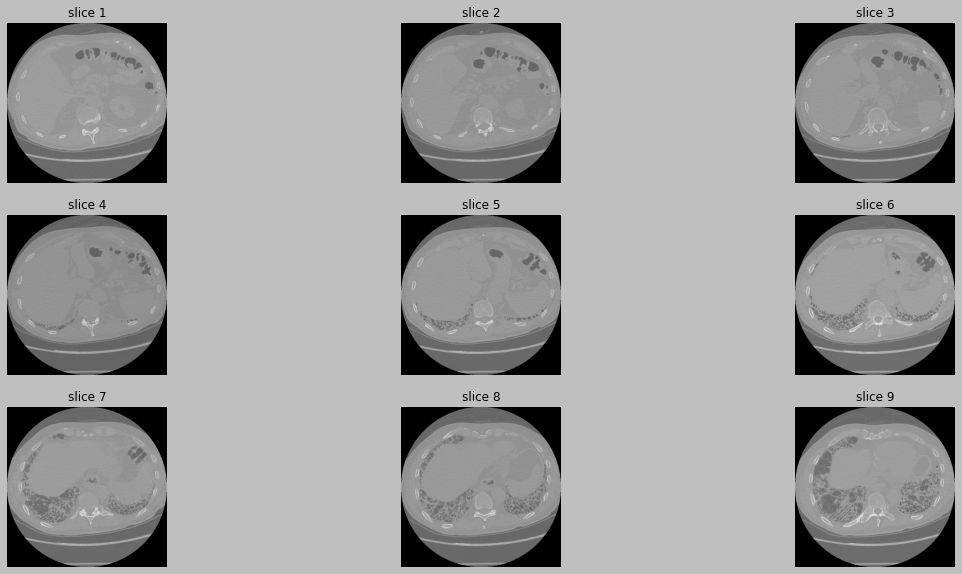

In [ ]:
plt.figure(figsize=(20, 10));
plt.style.use('grayscale');

for i,slice in enumerate(slices[:9]):
    image = slice.pixel_array

    plt.subplot(330 + i + 1)
    plt.imshow(image)
    plt.title(f'slice {i + 1}')
    plt.axis('off')

In [ ]:
! mkdir 'CT-slices_image'

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


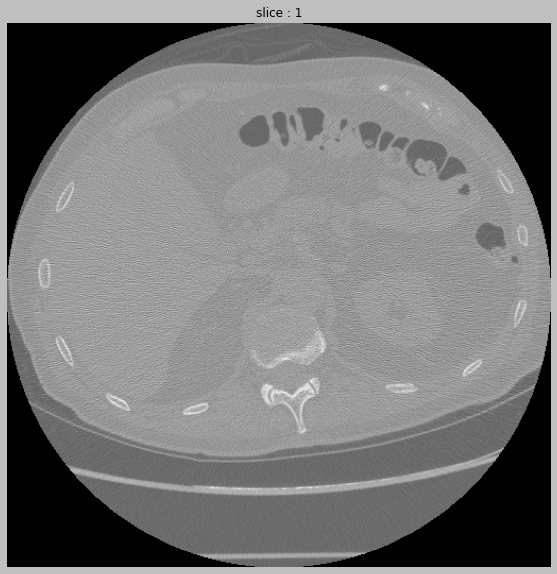

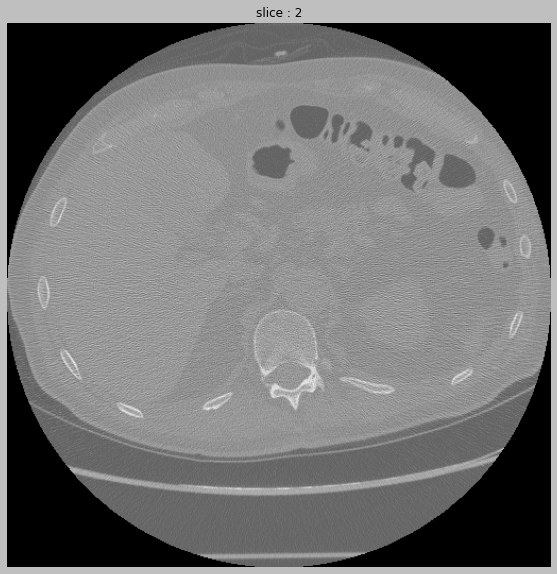

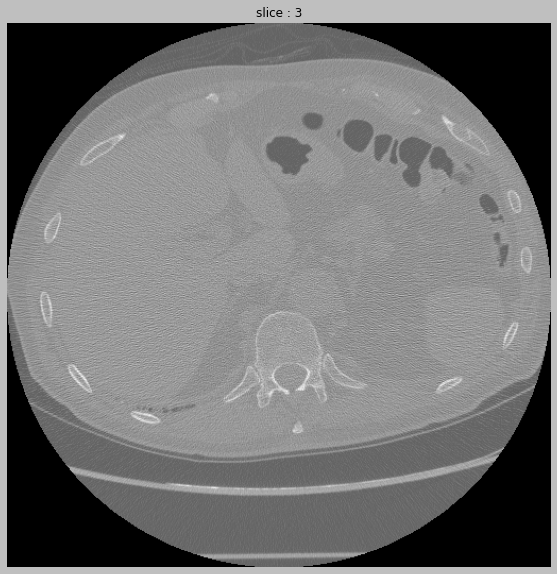

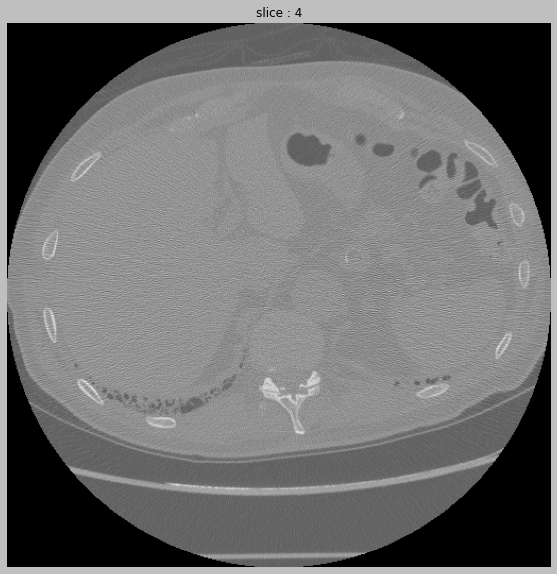

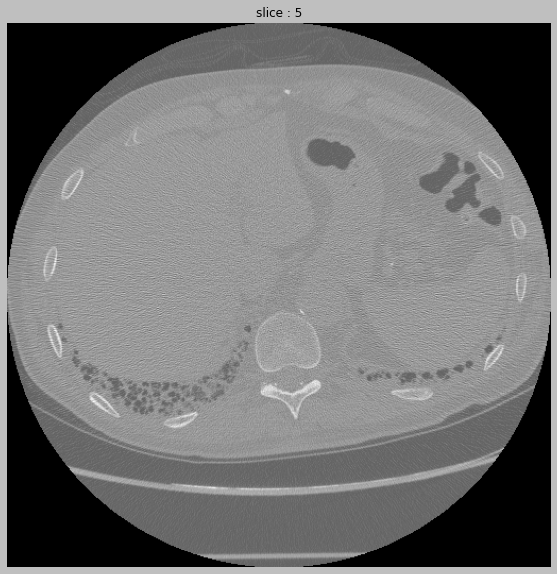

...

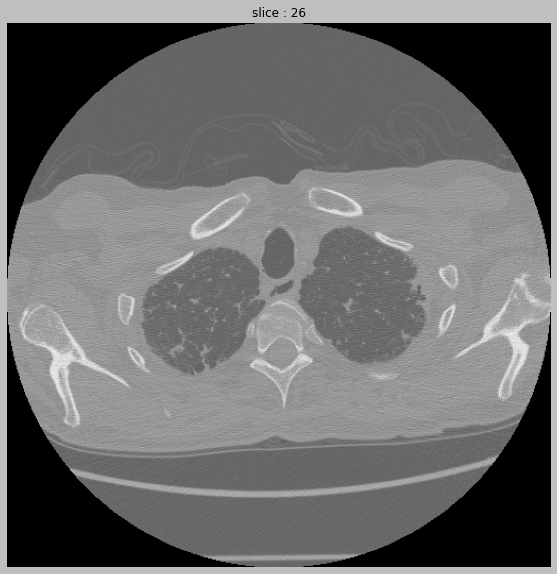

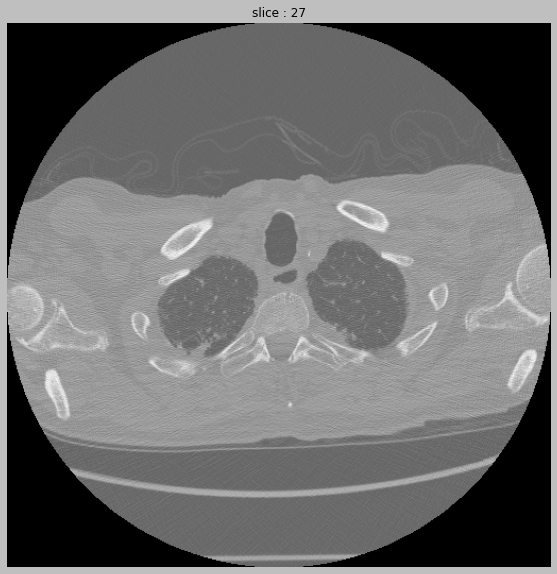

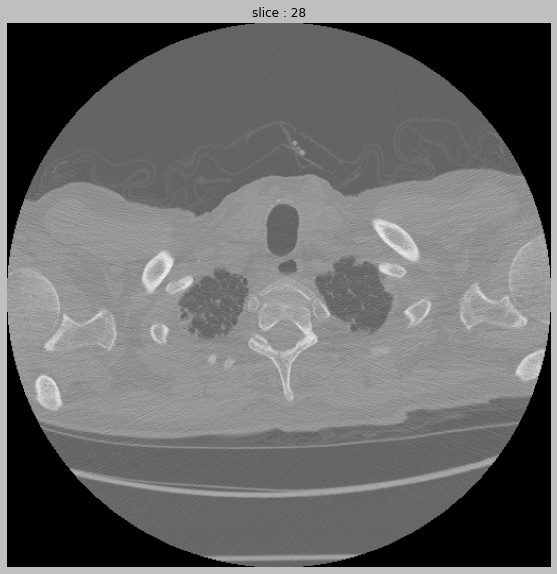

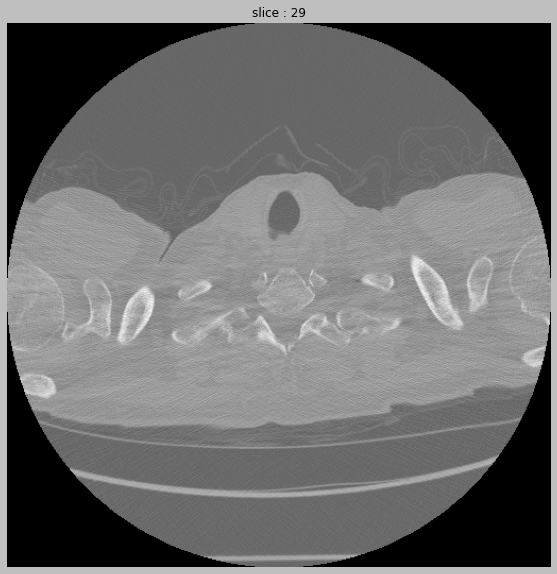

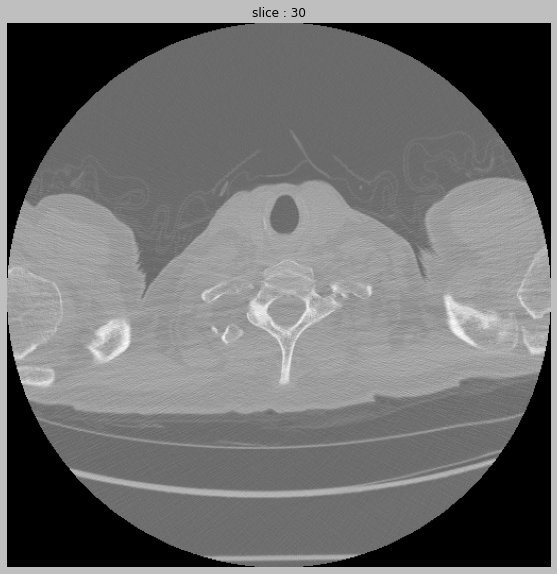

In [ ]:
for i,slice in enumerate(slices):
    plt.figure(figsize=(10,10))
    plt.title(f'slice : {i+1}')
    image = slice.pixel_array
    plt.imshow(image);
    plt.axis('off')
    plt.savefig(f'CT-slices_image/slice_{i+1:02}.png')

In [ ]:
sorted(glob.glob("CT-slices_image/slice_*.png"))

['CT-slices_image/slice_01.png',
 'CT-slices_image/slice_02.png',
 'CT-slices_image/slice_03.png',
 'CT-slices_image/slice_04.png',
 'CT-slices_image/slice_05.png',
 'CT-slices_image/slice_06.png',
 'CT-slices_image/slice_07.png',
 'CT-slices_image/slice_08.png',
 'CT-slices_image/slice_09.png',
 'CT-slices_image/slice_10.png',
 'CT-slices_image/slice_11.png',
 'CT-slices_image/slice_12.png',
 'CT-slices_image/slice_13.png',
 'CT-slices_image/slice_14.png',
 'CT-slices_image/slice_15.png',
 'CT-slices_image/slice_16.png',
 'CT-slices_image/slice_17.png',
 'CT-slices_image/slice_18.png',
 'CT-slices_image/slice_19.png',
 'CT-slices_image/slice_20.png',
 'CT-slices_image/slice_21.png',
 'CT-slices_image/slice_22.png',
 'CT-slices_image/slice_23.png',
 'CT-slices_image/slice_24.png',
 'CT-slices_image/slice_25.png',
 'CT-slices_image/slice_26.png',
 'CT-slices_image/slice_27.png',
 'CT-slices_image/slice_28.png',
 'CT-slices_image/slice_29.png',
 'CT-slices_image/slice_30.png']

In [ ]:
import glob
from PIL import Image

# filepaths
fp_in = "CT-slices_image/slice_*.png"
fp_out = "CT-slices_image/image.gif"

imgs = (Image.open(f) for f in sorted(glob.glob(fp_in)))
img = next(imgs)  # extract first image from iterator
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=450, loop=0)

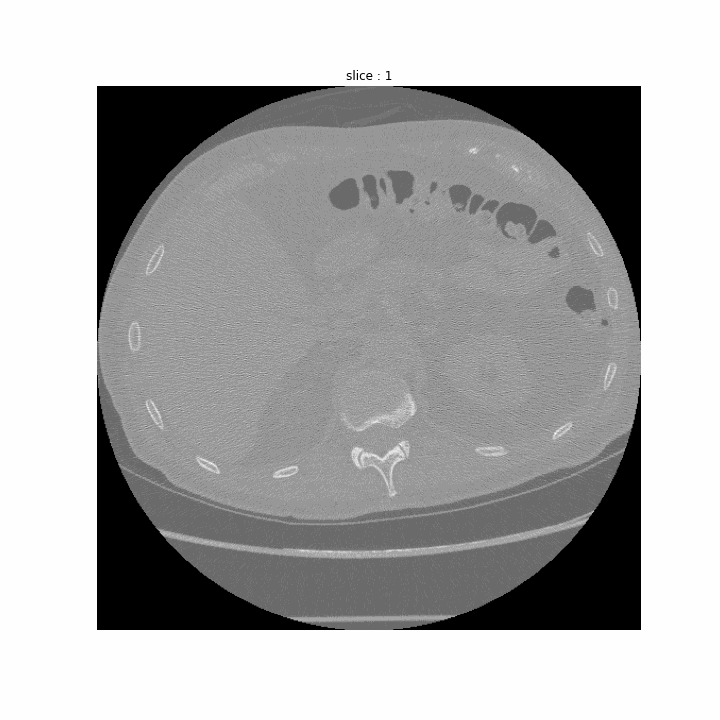

In [ ]:
from IPython.display import Image
Image(open('CT-slices_image/image.gif','rb').read())